In [2]:
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
import torch.optim as optim
import torch.nn as nn
from scipy.optimize import minimize
import math



In [3]:
def u_exact(x, y, r_star):
    r = np.sqrt(x**2 + y**2)
    U_exact = np.zeros_like(r)
    cond1 = r <= r_star
    cond2 = r > r_star
    r_tmp = ((-1) * (r_star**2) * np.log(r / 2)) / np.sqrt(1 - r_star**2)
    U_exact[cond1] = np.sqrt(1 - r**2)[cond1]
    U_exact[cond2] = r_tmp[cond2]
    return U_exact

C:\Users\Sadman\AppData\Local\Temp\ipykernel_18760\2896465637.py:202: RuntimeWarning: invalid value encountered in sqrt
  g_interior = np.sqrt(1 - np.sqrt(X_interior ** 2 + Y_interior ** 2) ** 2)
C:\Users\Sadman\AppData\Local\Temp\ipykernel_18760\2896465637.py:168: RuntimeWarning: invalid value encountered in sqrt
  U_exact[cond1] = np.sqrt(1 - r**2)[cond1]


Epoch 0/6000, Loss: 4871093.5, L1 Error: 0.27100399136543274


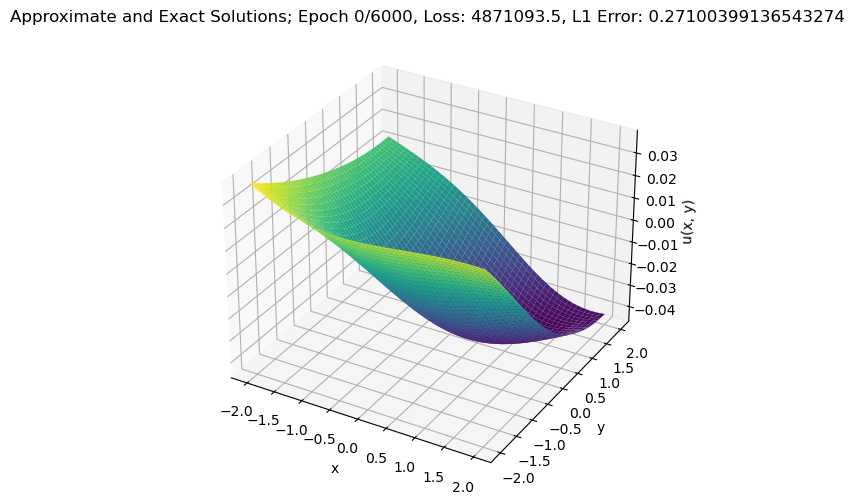

Epoch 100/6000, Loss: 1608098.25, L1 Error: 0.23536889255046844


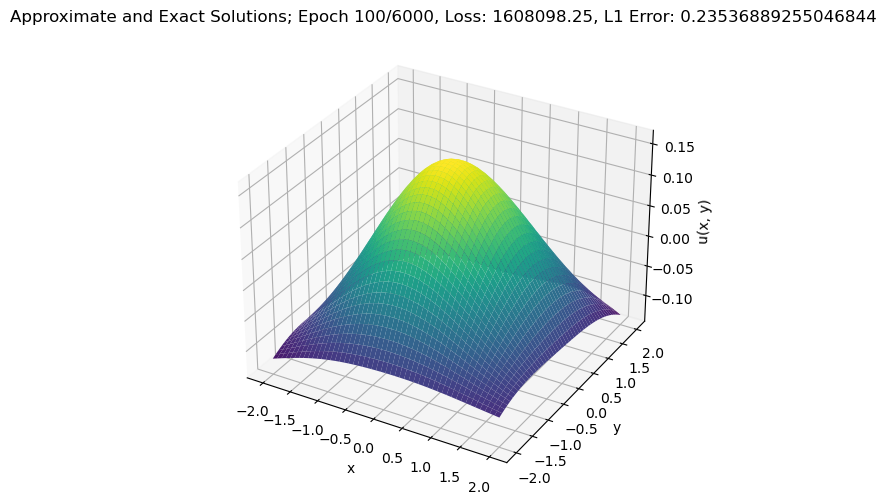

Epoch 200/6000, Loss: 1594016.0, L1 Error: 0.20424379408359528


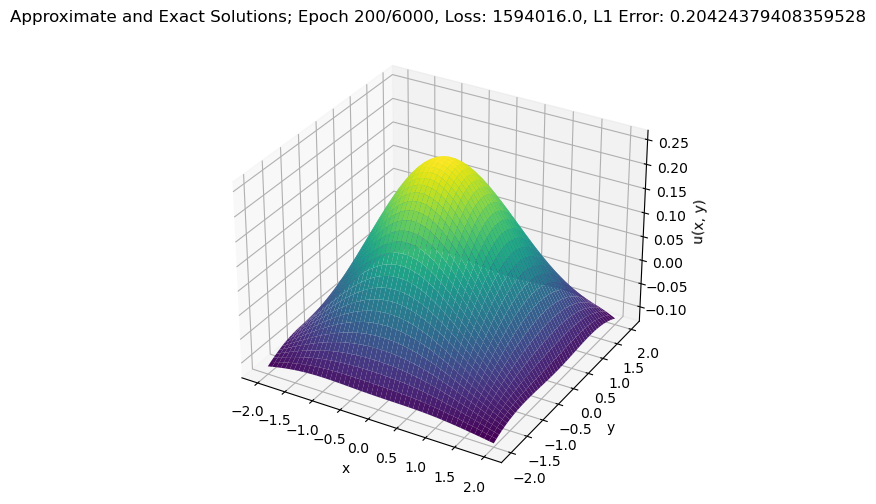

Epoch 300/6000, Loss: 1578544.25, L1 Error: 0.19034911692142487


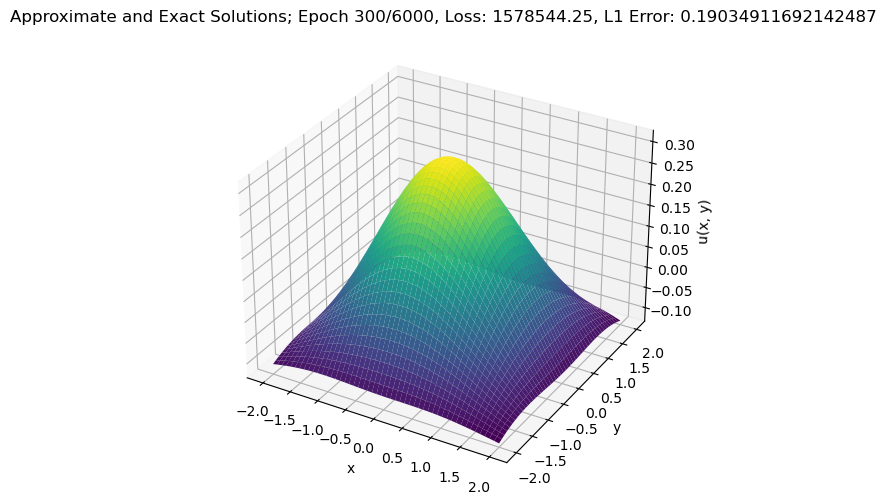

Epoch 400/6000, Loss: 1559709.875, L1 Error: 0.18337202072143555


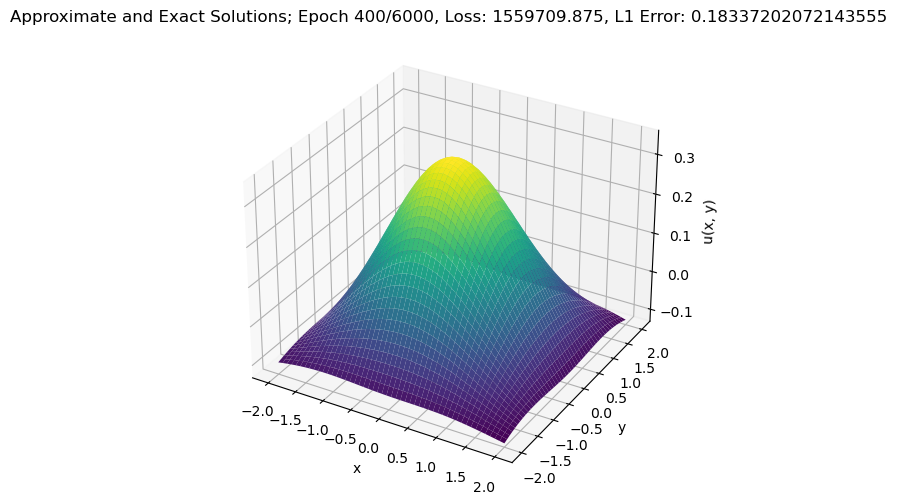

Epoch 500/6000, Loss: 1548279.5, L1 Error: 0.16331887245178223


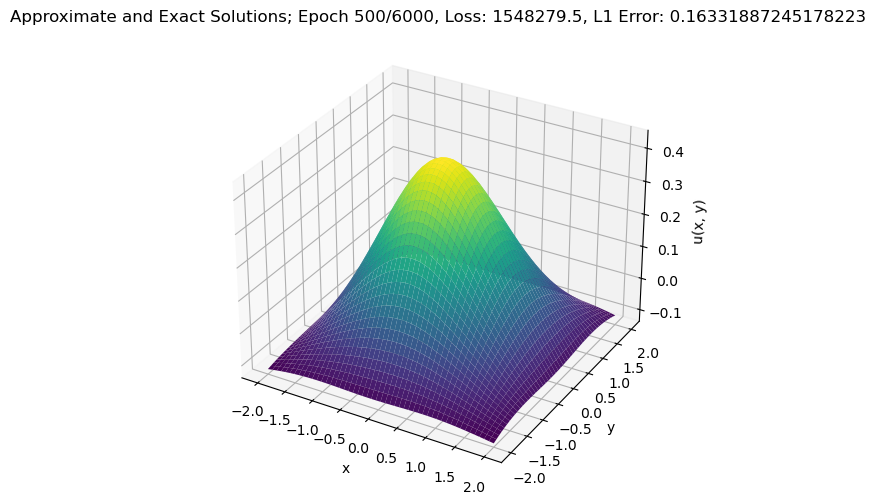

Epoch 600/6000, Loss: 1522882.75, L1 Error: 0.14235398173332214


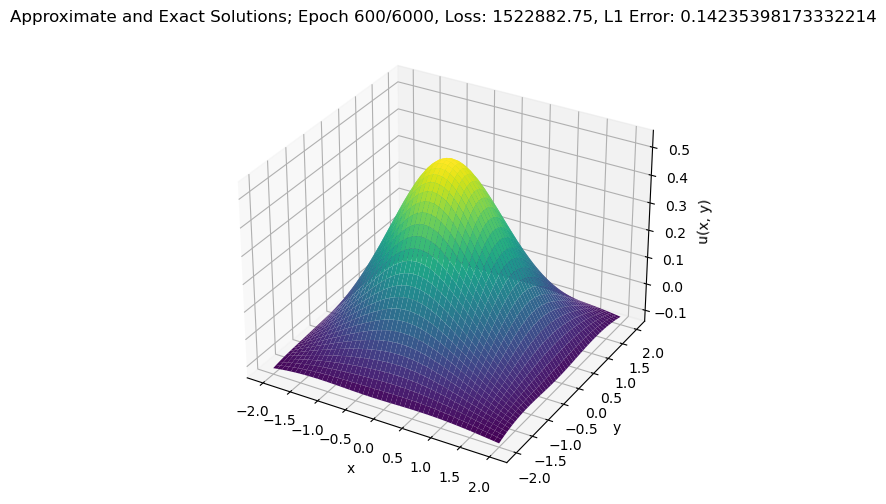

Epoch 700/6000, Loss: 1514083.375, L1 Error: 0.1226343959569931


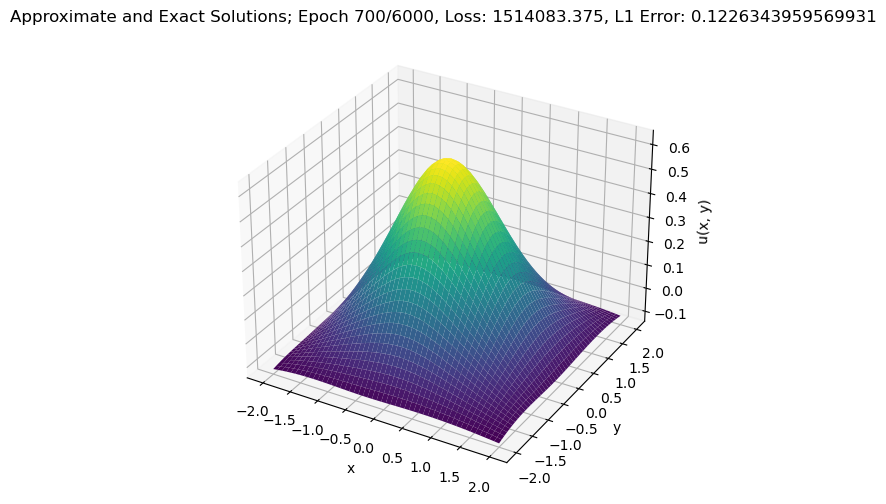

Epoch 800/6000, Loss: 1508461.0, L1 Error: 0.11233478039503098


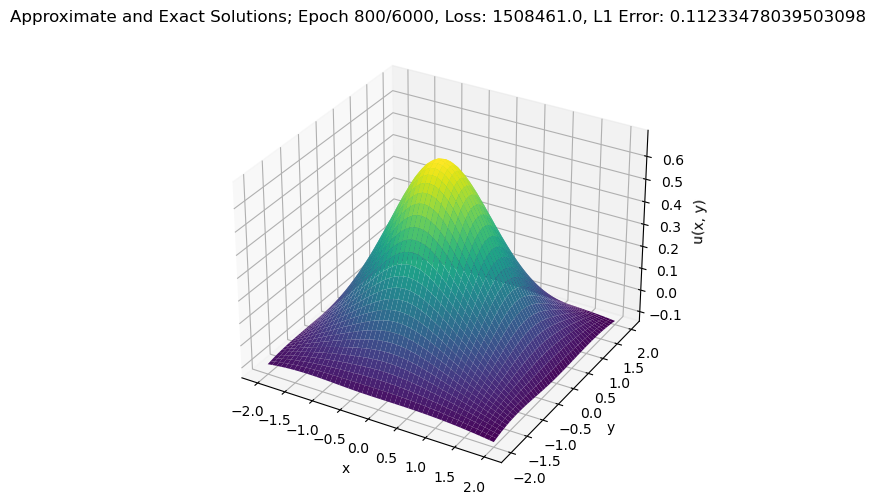

Epoch 900/6000, Loss: 1510355.625, L1 Error: 0.11125028133392334


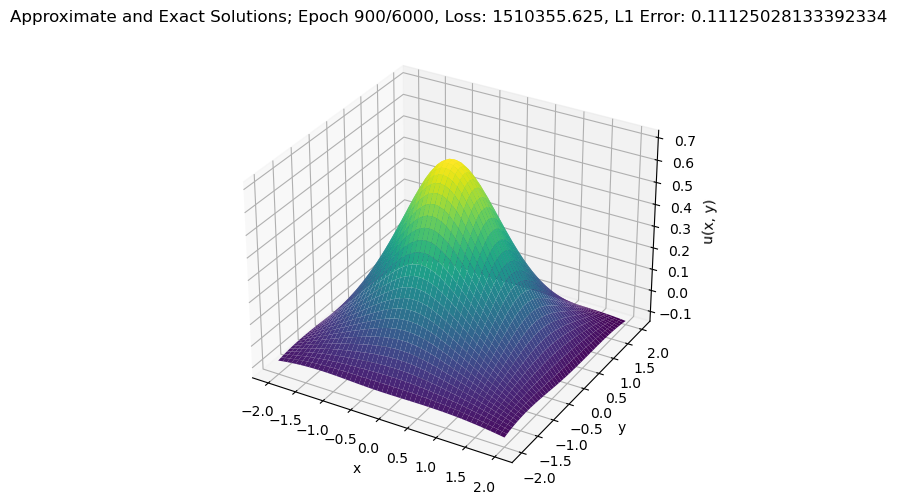

Epoch 1000/6000, Loss: 1482446.0, L1 Error: 0.11982365697622299


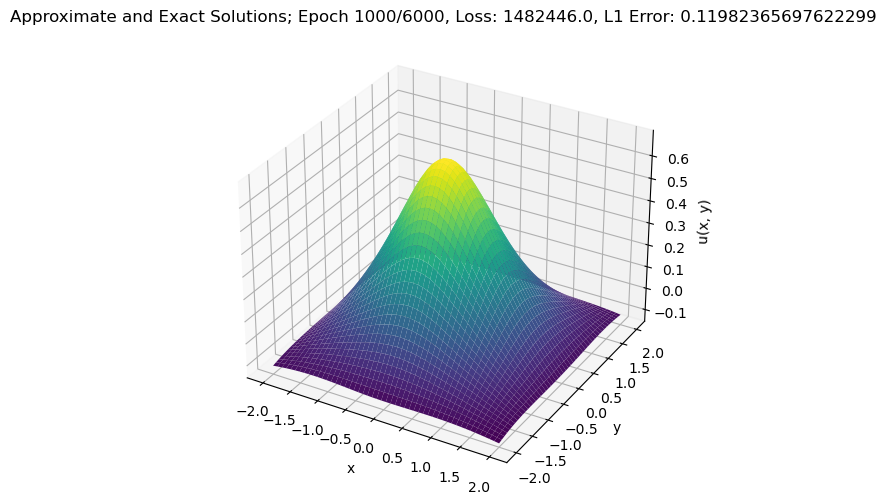

Epoch 1100/6000, Loss: 1486506.0, L1 Error: 0.1137600988149643


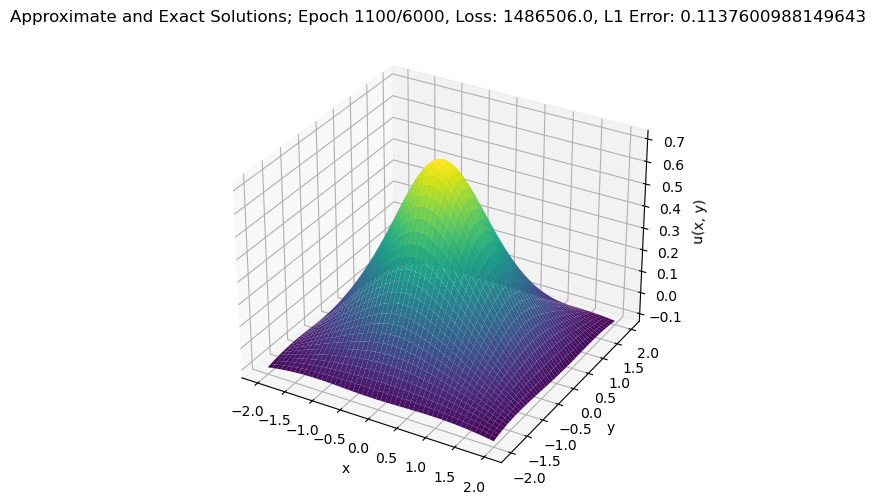

Epoch 1200/6000, Loss: 1475731.625, L1 Error: 0.10130175948143005


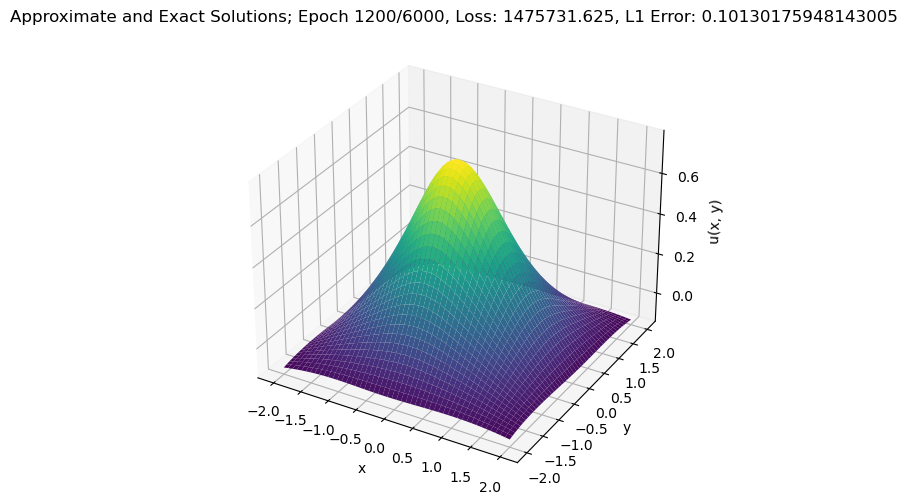

Epoch 1300/6000, Loss: 1501037.875, L1 Error: 0.09346533566713333


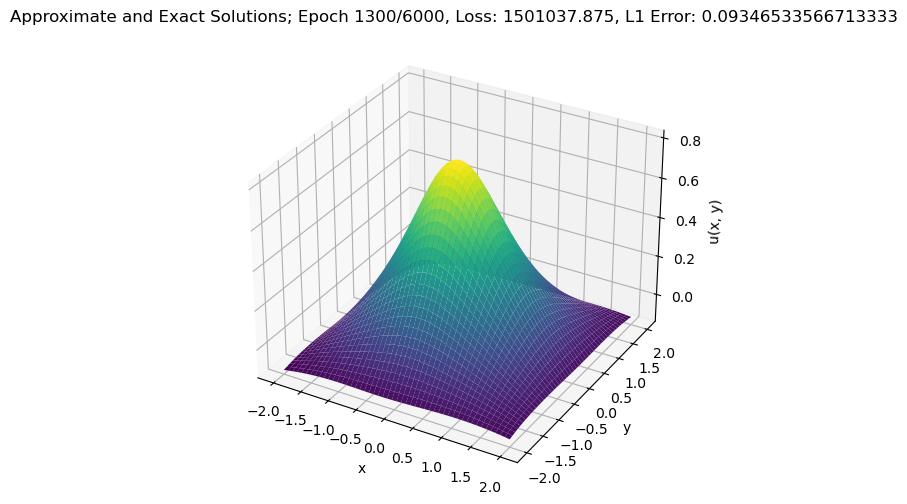

Epoch 1400/6000, Loss: 1504170.0, L1 Error: 0.09922751039266586


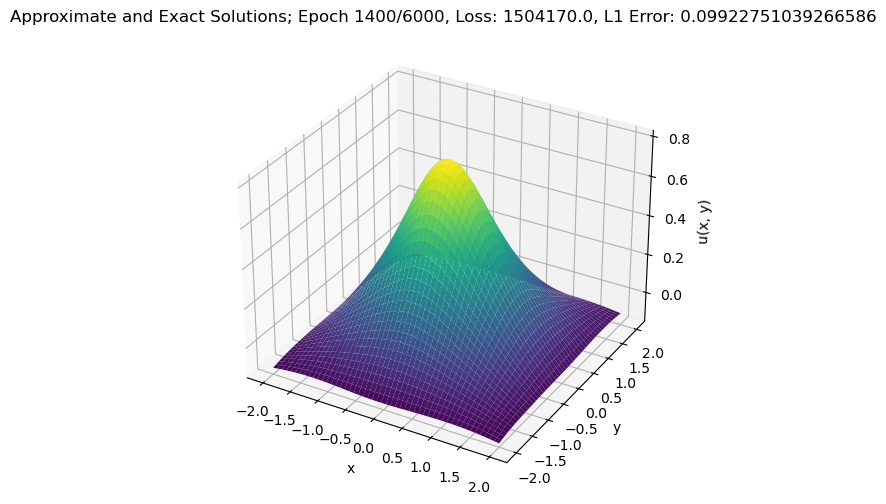

Epoch 1500/6000, Loss: 1488679.375, L1 Error: 0.09473477303981781


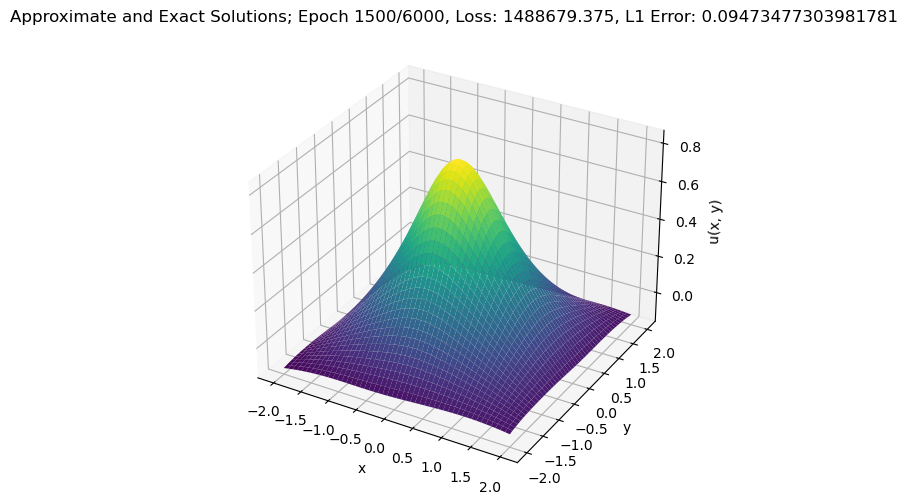

Epoch 1600/6000, Loss: 1464923.75, L1 Error: 0.08138403296470642


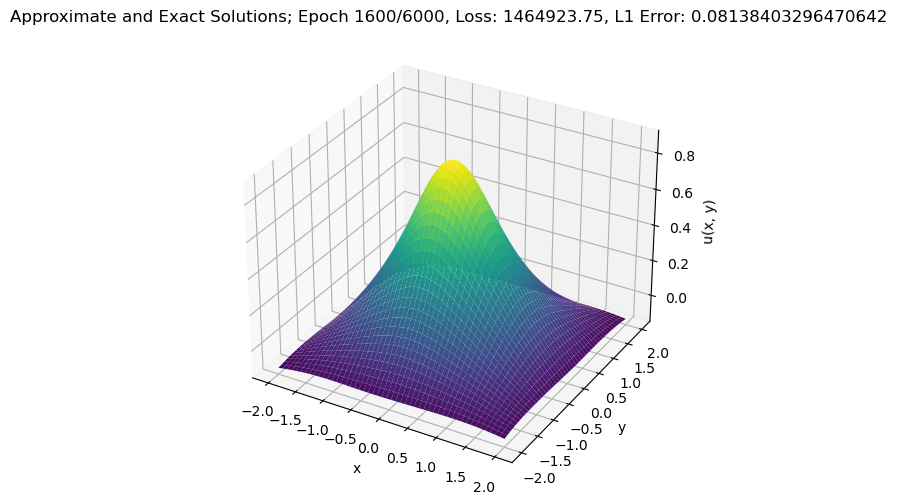

Epoch 1700/6000, Loss: 1461102.75, L1 Error: 0.07348979264497757


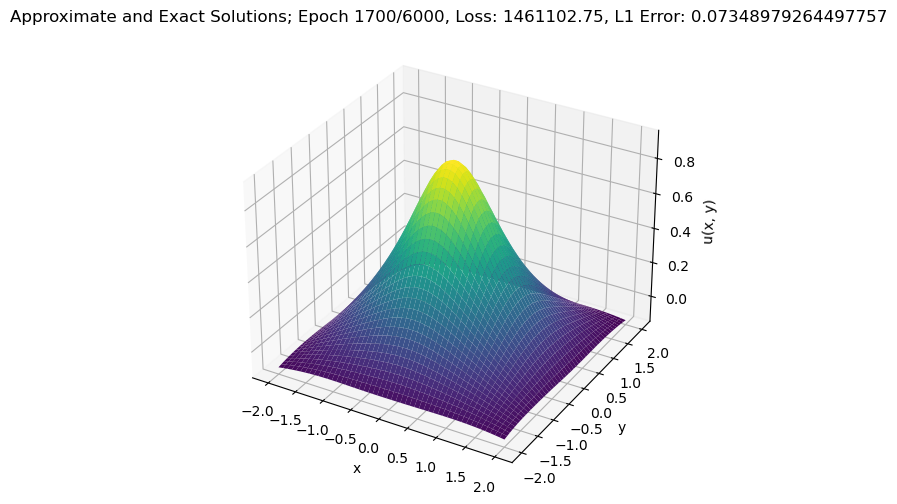

Epoch 1800/6000, Loss: 1457546.375, L1 Error: 0.07469391077756882


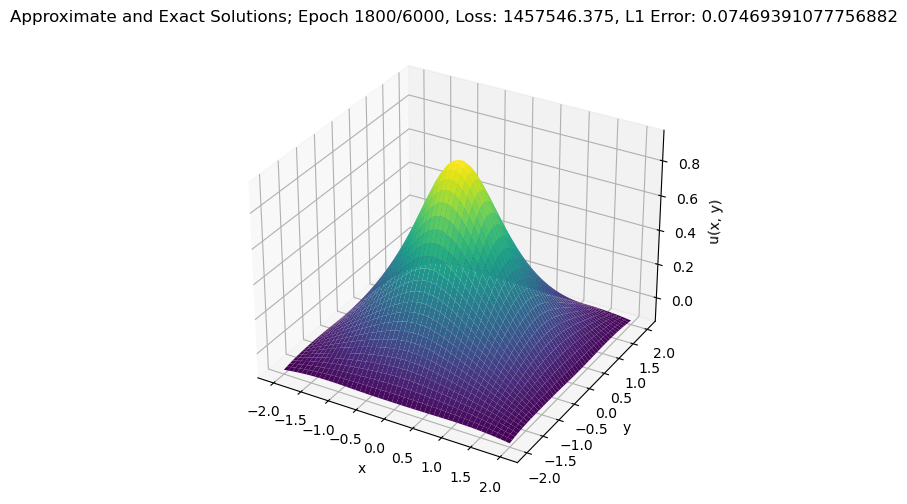

Epoch 1900/6000, Loss: 1448094.125, L1 Error: 0.07184923440217972


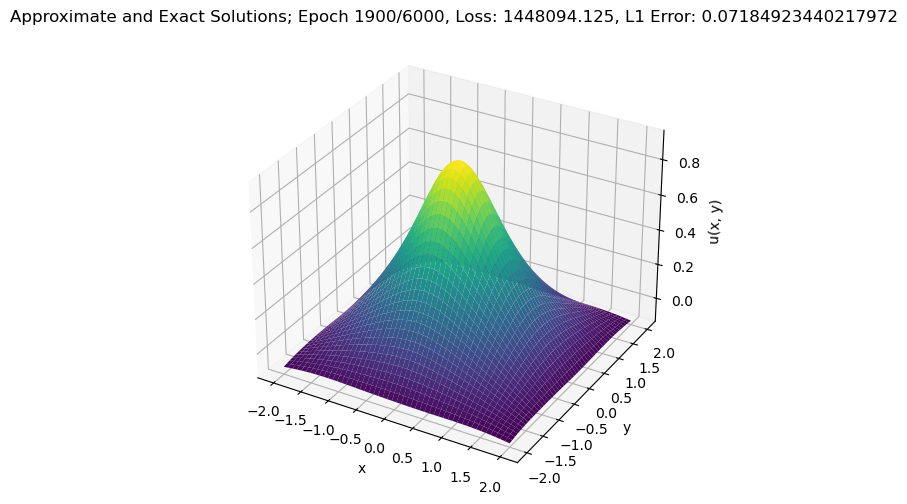

Epoch 2000/6000, Loss: 1452828.0, L1 Error: 0.08483637869358063


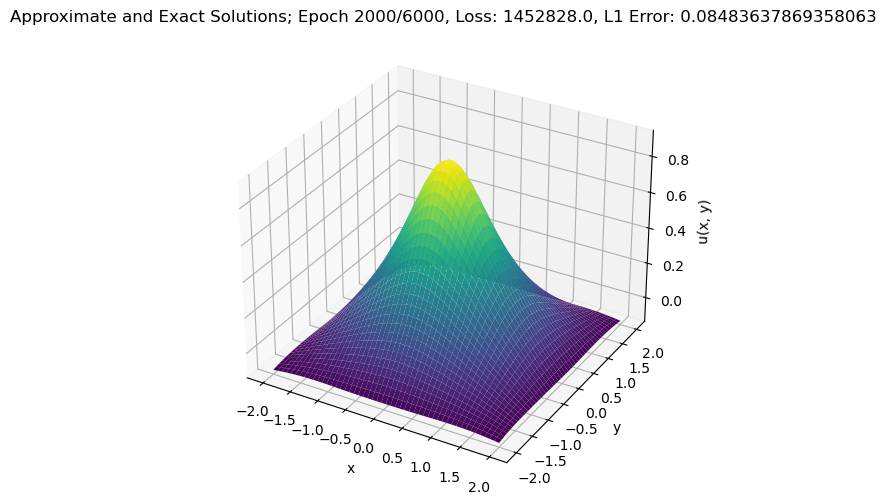

Epoch 2100/6000, Loss: 1449248.0, L1 Error: 0.07794930785894394


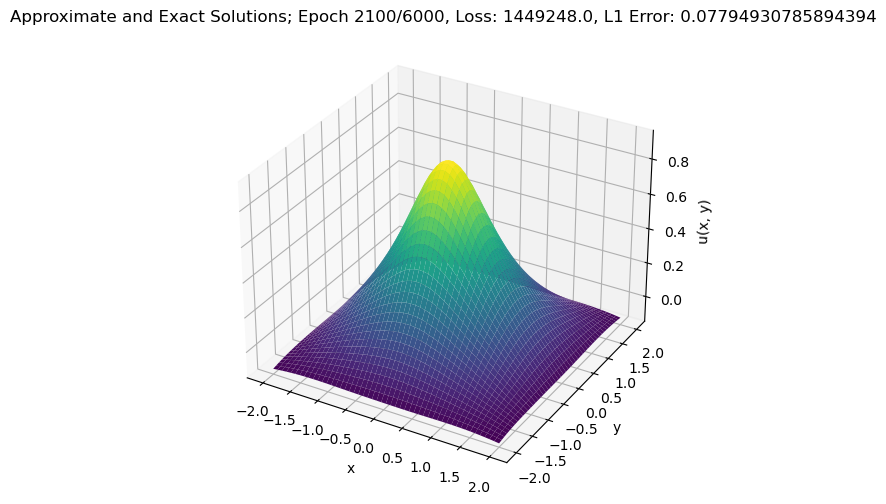

Epoch 2200/6000, Loss: 1454919.125, L1 Error: 0.06827373057603836


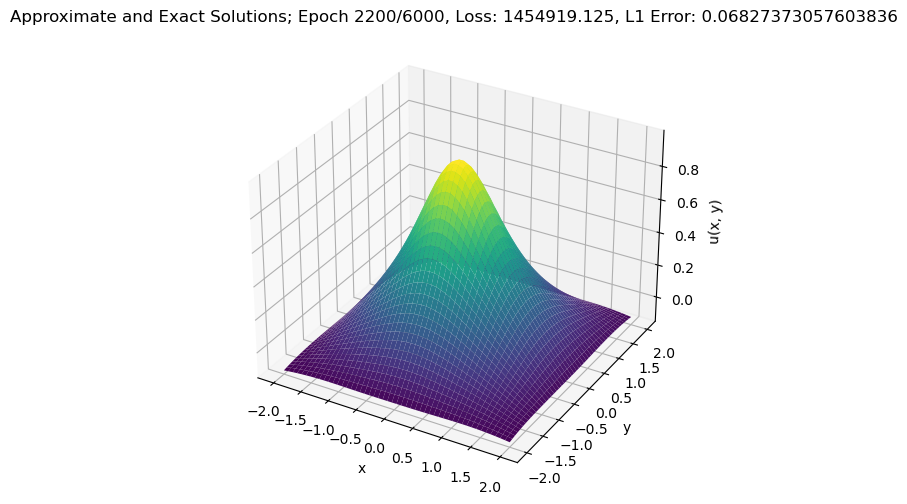

Epoch 2300/6000, Loss: 1497278.5, L1 Error: 0.08696392923593521


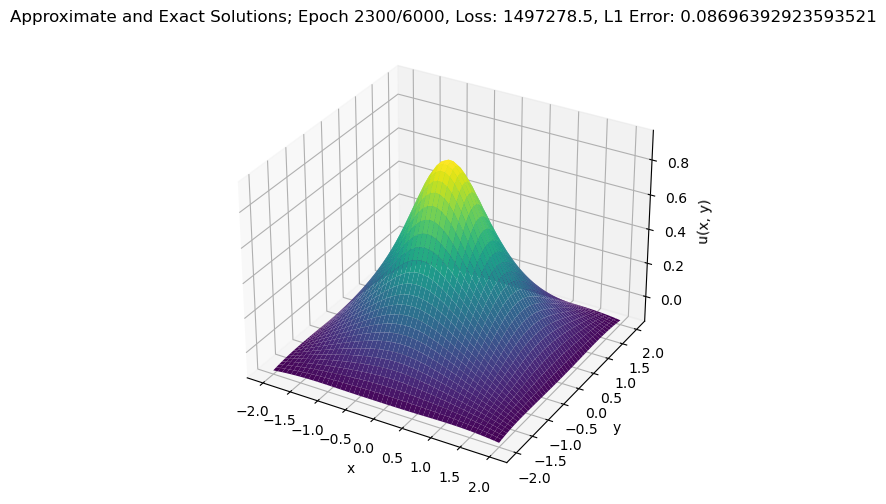

Epoch 2400/6000, Loss: 1547821.875, L1 Error: 0.10401070863008499


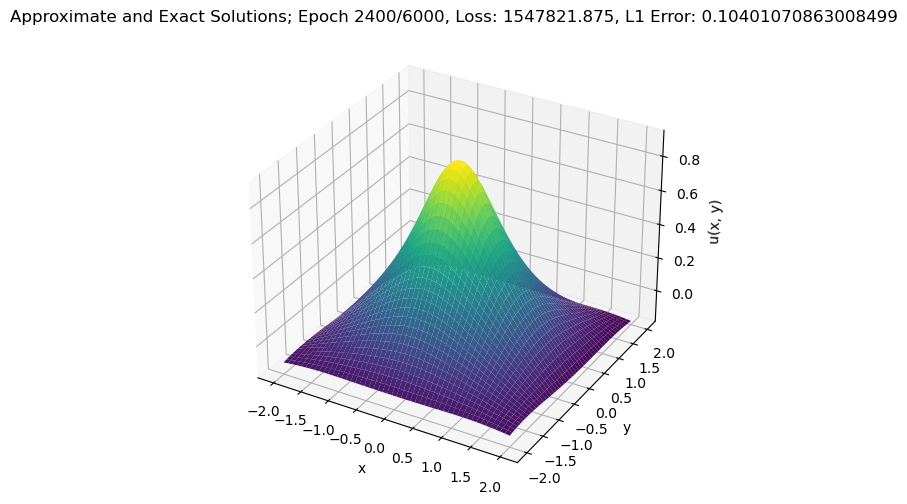

Epoch 2500/6000, Loss: 1464709.0, L1 Error: 0.06165098771452904


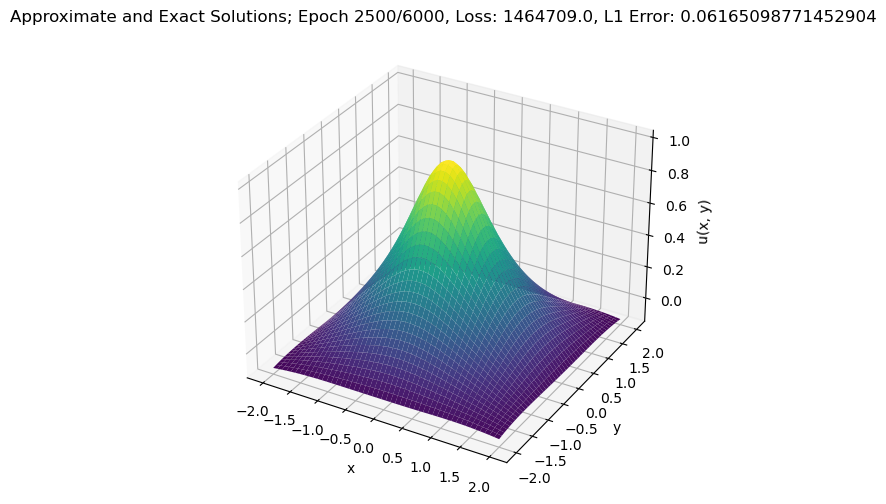

Epoch 2600/6000, Loss: 1449386.5, L1 Error: 0.09031980484724045


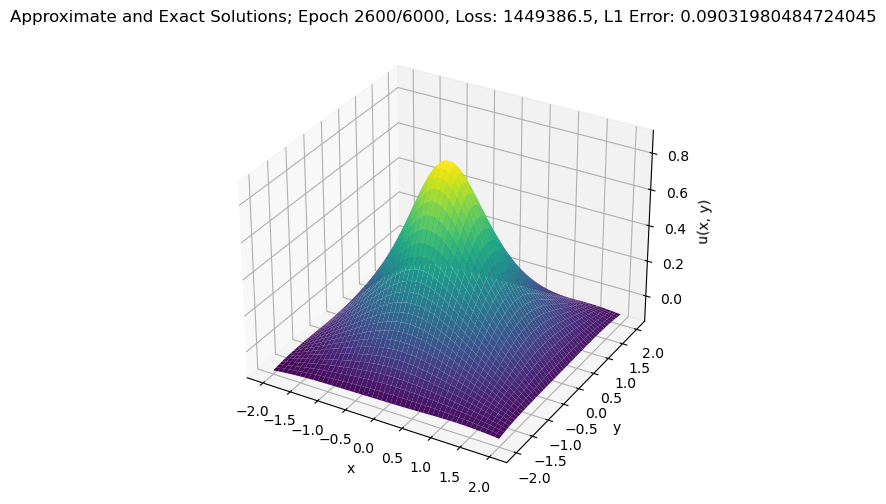

Epoch 2700/6000, Loss: 1471266.625, L1 Error: 0.056352995336055756


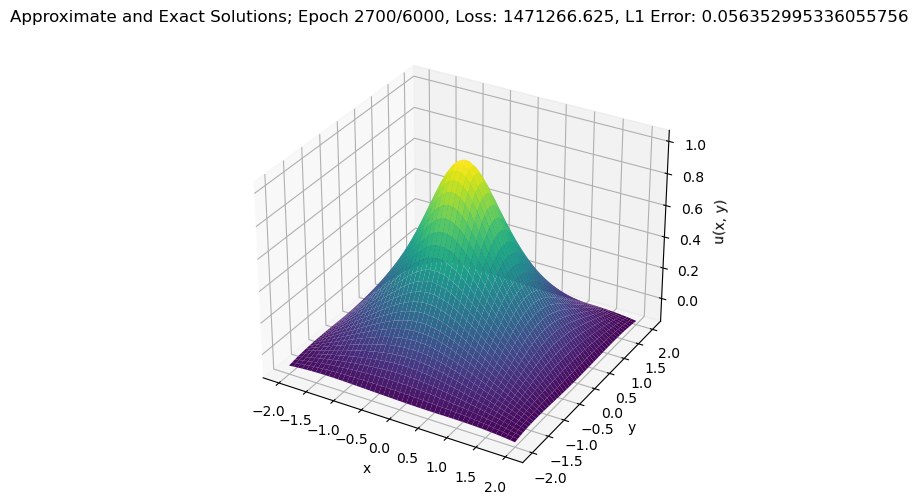

Epoch 2800/6000, Loss: 1435125.0, L1 Error: 0.08289877325296402


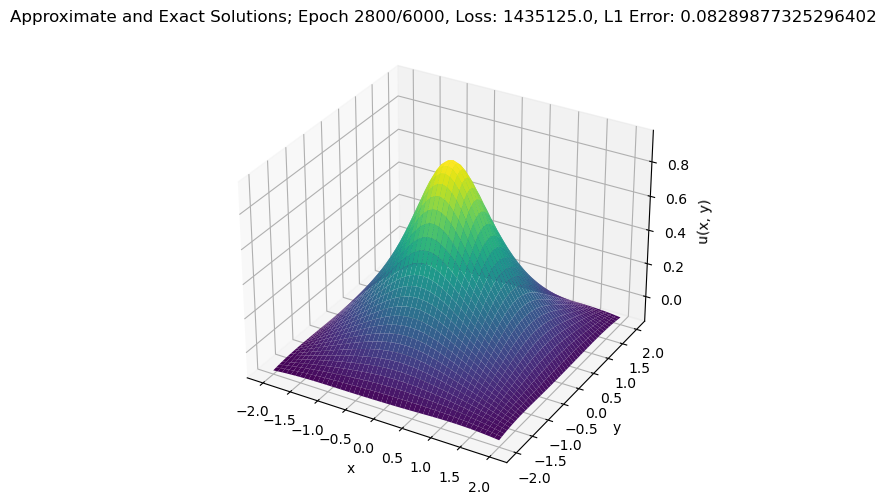

Epoch 2900/6000, Loss: 1480161.5, L1 Error: 0.05629080906510353


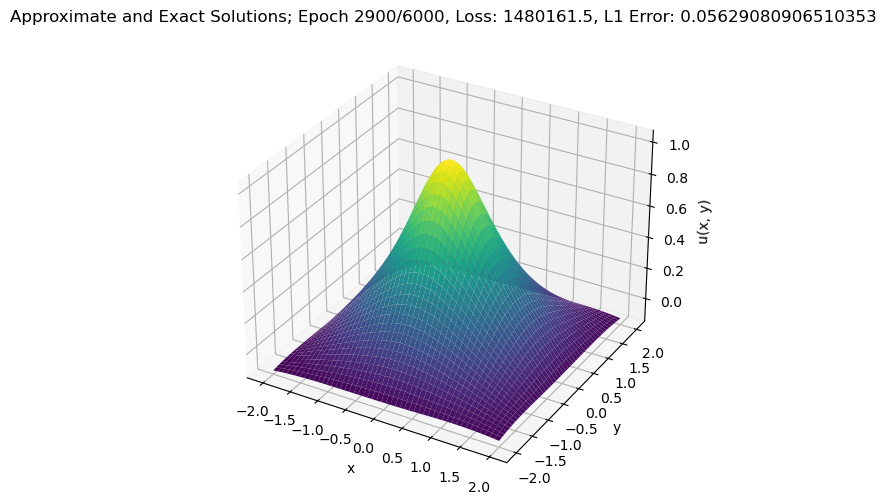

Epoch 3000/6000, Loss: 1477600.0, L1 Error: 0.05751724913716316


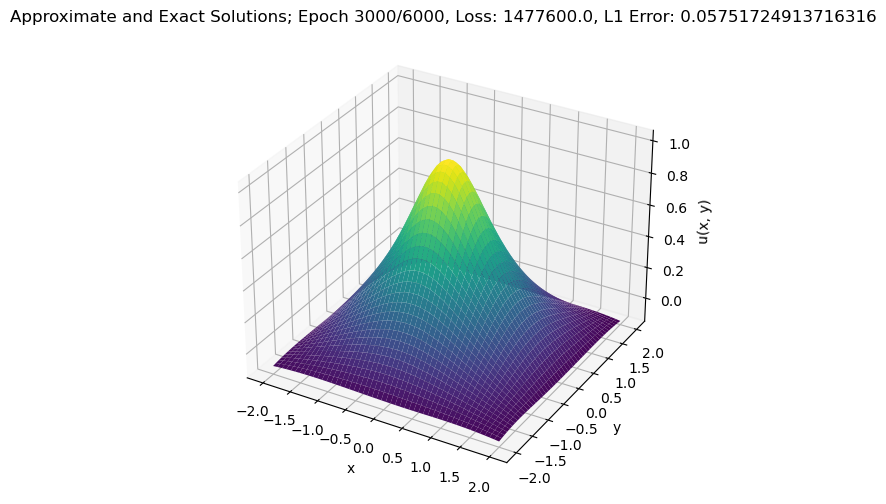

Epoch 3100/6000, Loss: 1484001.25, L1 Error: 0.0662657842040062


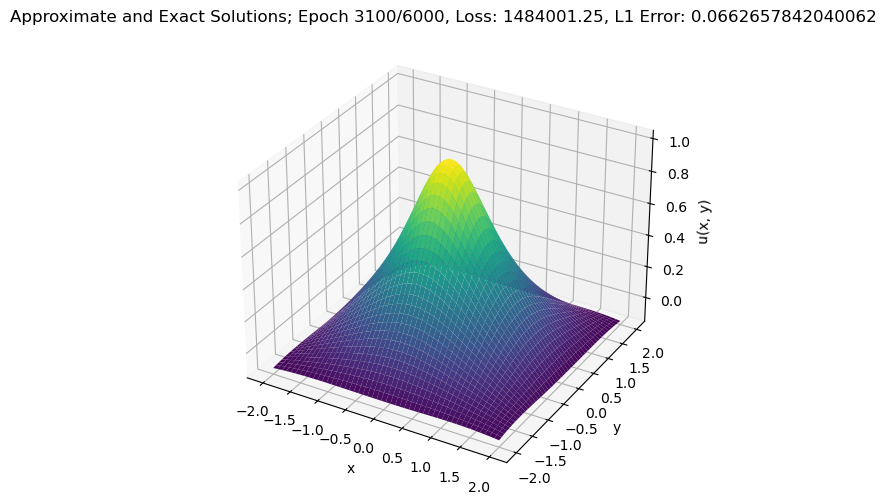

Epoch 3200/6000, Loss: 1462506.625, L1 Error: 0.09433536231517792


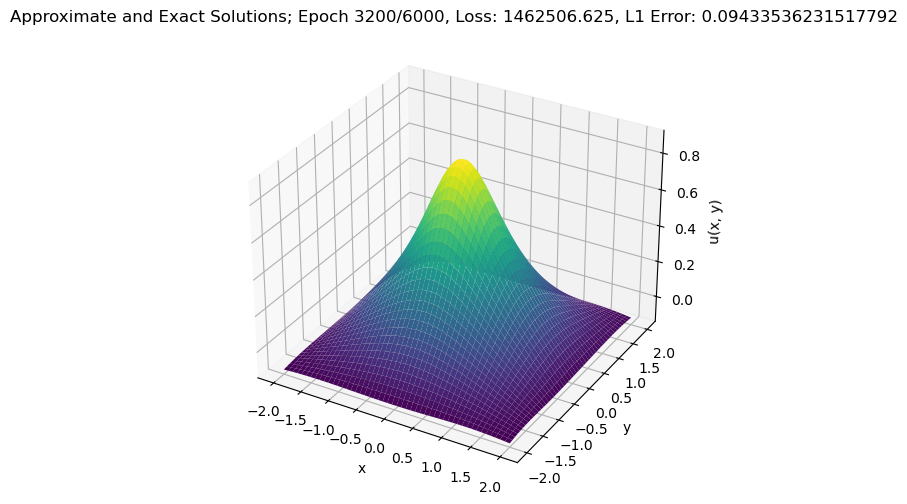

Epoch 3300/6000, Loss: 1434522.625, L1 Error: 0.07156340777873993


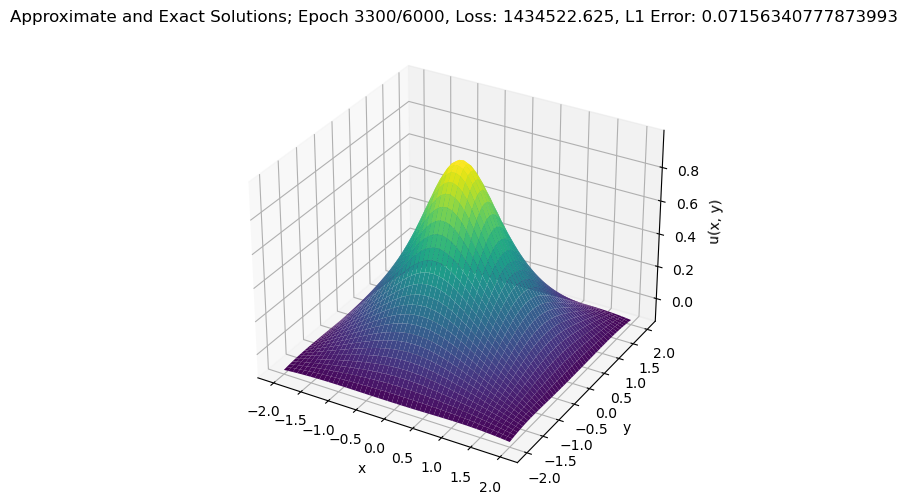

Epoch 3400/6000, Loss: 1466246.75, L1 Error: 0.07655569165945053


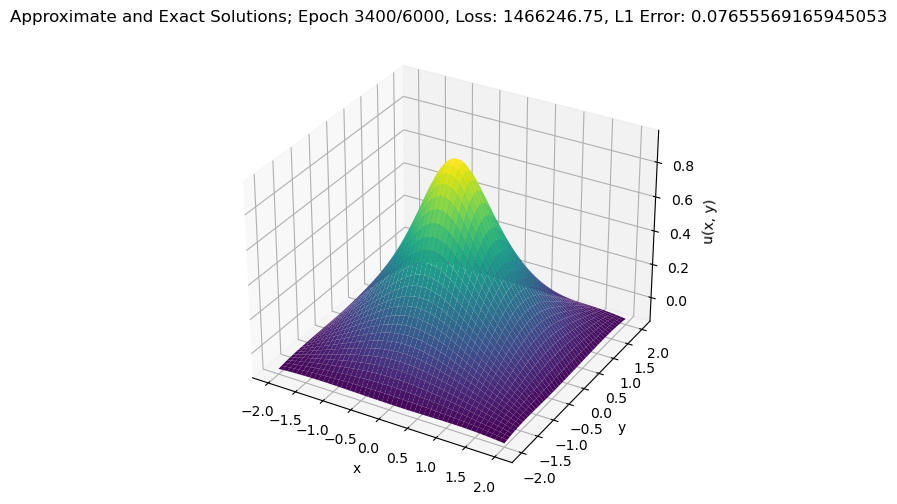

Epoch 3500/6000, Loss: 1466037.25, L1 Error: 0.05123394727706909


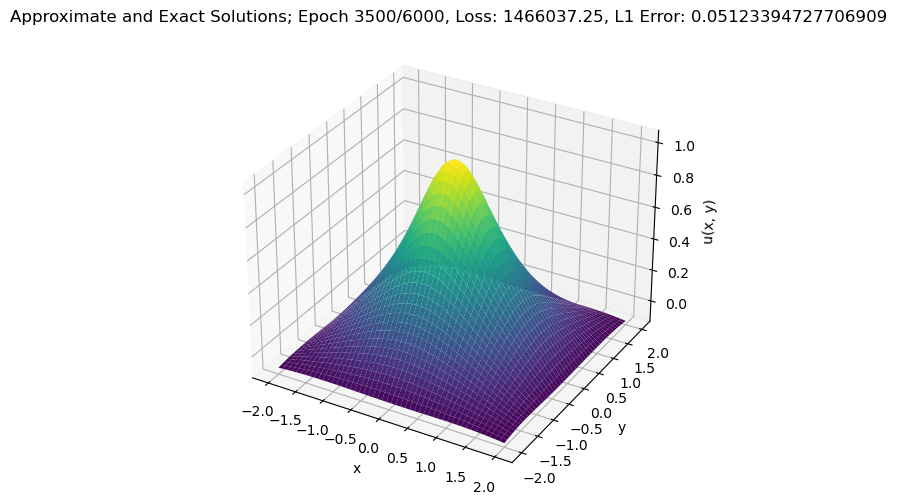

Epoch 3600/6000, Loss: 1432604.0, L1 Error: 0.07526496052742004


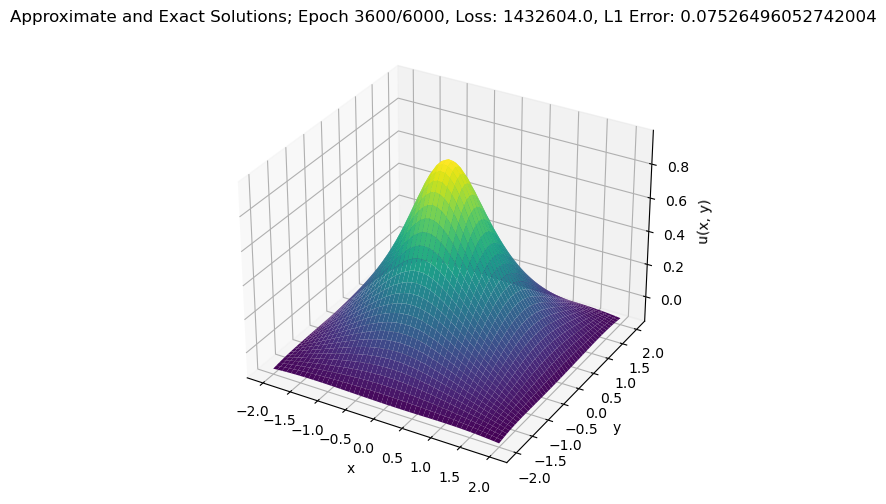

Epoch 3700/6000, Loss: 1455319.0, L1 Error: 0.07217394560575485


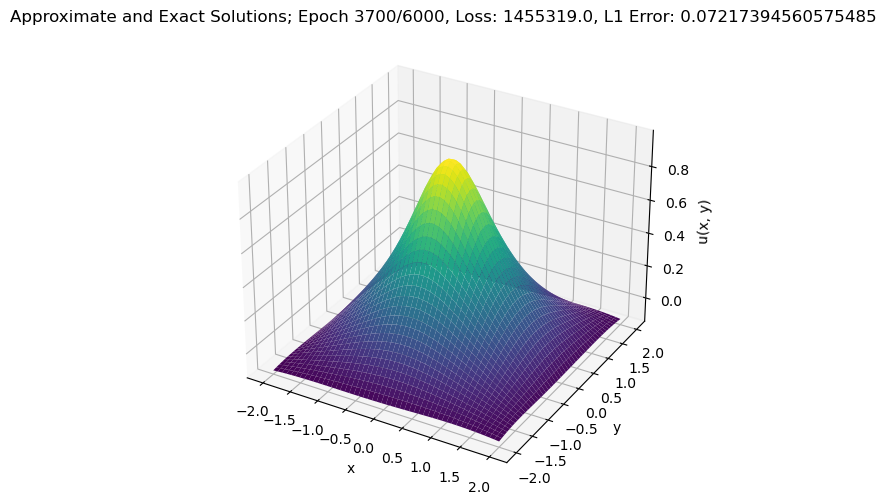

Epoch 3800/6000, Loss: 1444297.25, L1 Error: 0.0698225125670433


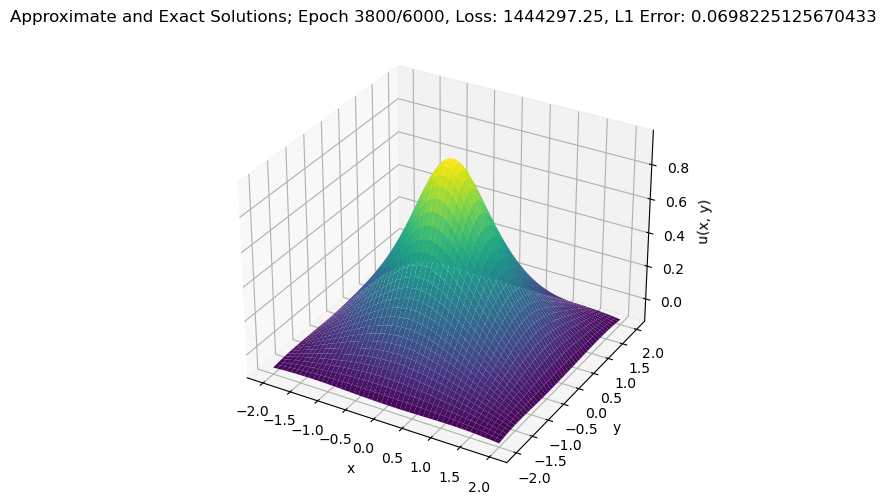

Epoch 3900/6000, Loss: 1428585.25, L1 Error: 0.08099319785833359


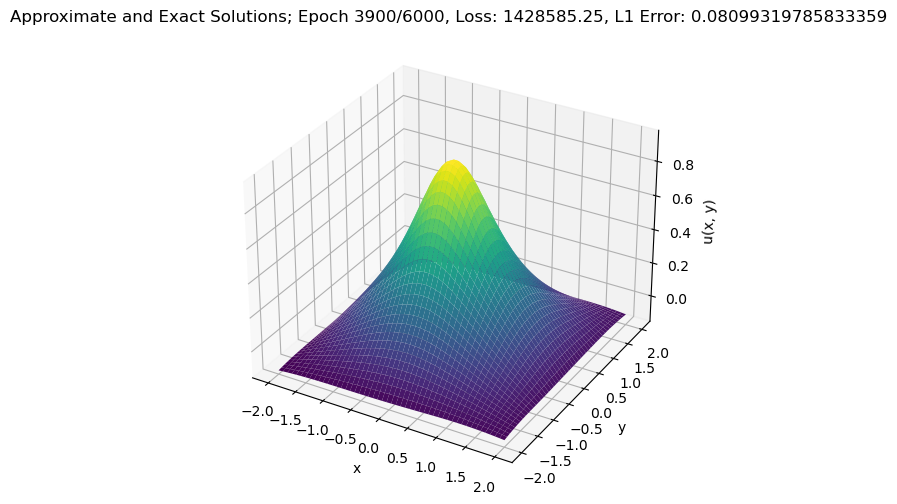

Epoch 4000/6000, Loss: 1483175.5, L1 Error: 0.04953167960047722


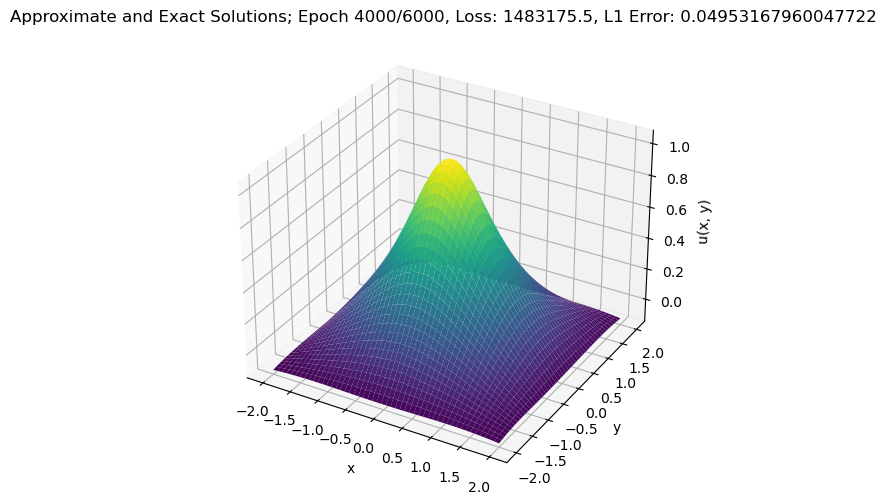

Epoch 4100/6000, Loss: 1448503.5, L1 Error: 0.0666583999991417


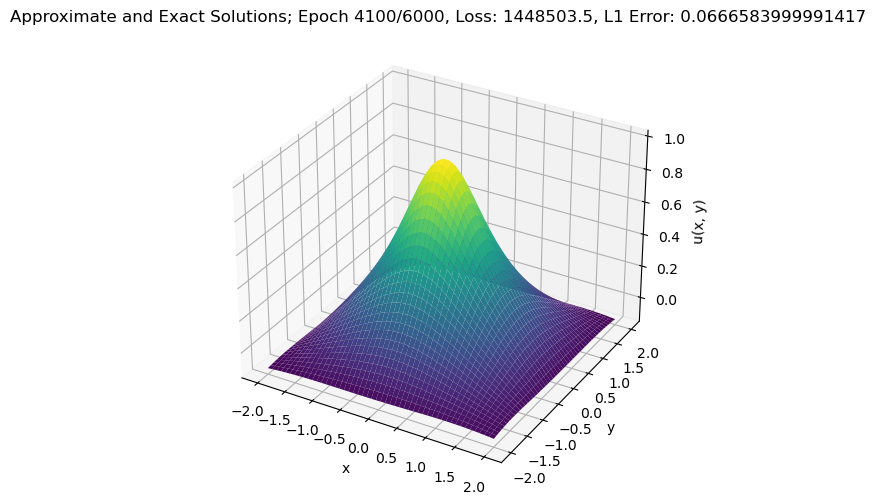

Epoch 4200/6000, Loss: 1439360.25, L1 Error: 0.07047099620103836


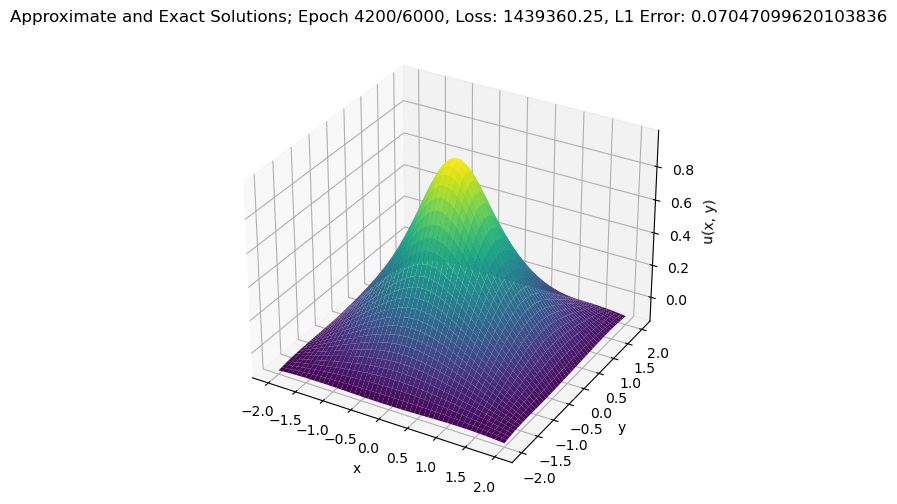

Epoch 4300/6000, Loss: 1451921.5, L1 Error: 0.05922124162316322


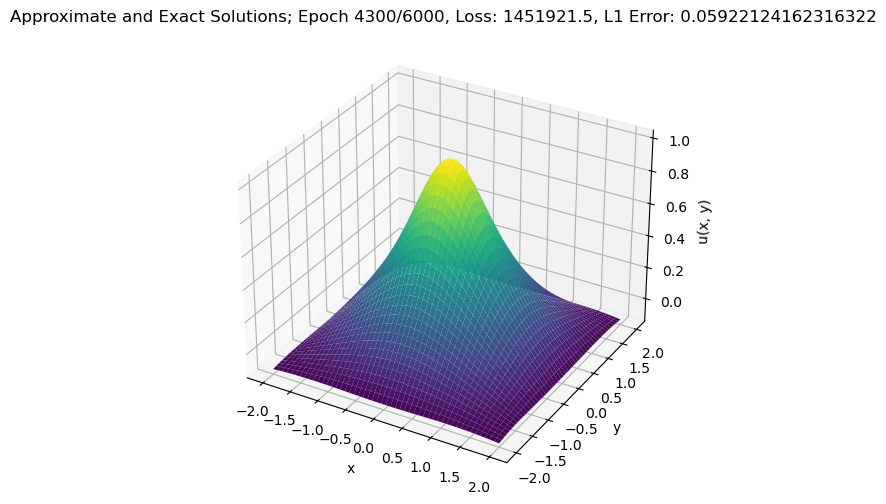

Epoch 4400/6000, Loss: 1432876.75, L1 Error: 0.05584915727376938


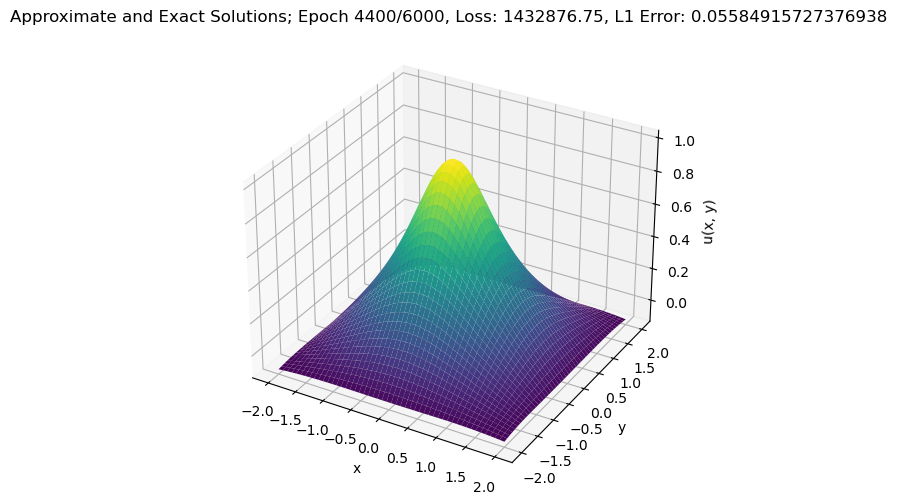

Epoch 4500/6000, Loss: 1432015.5, L1 Error: 0.07469427585601807


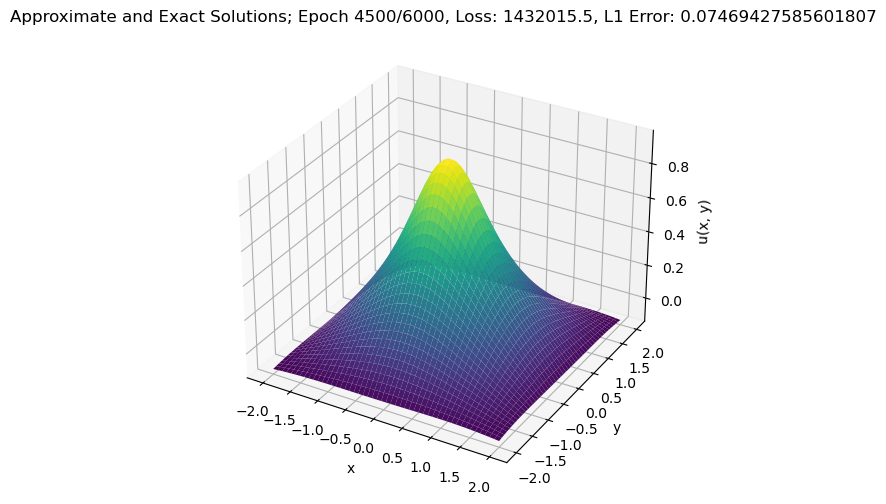

Epoch 4600/6000, Loss: 1452127.0, L1 Error: 0.06706584244966507


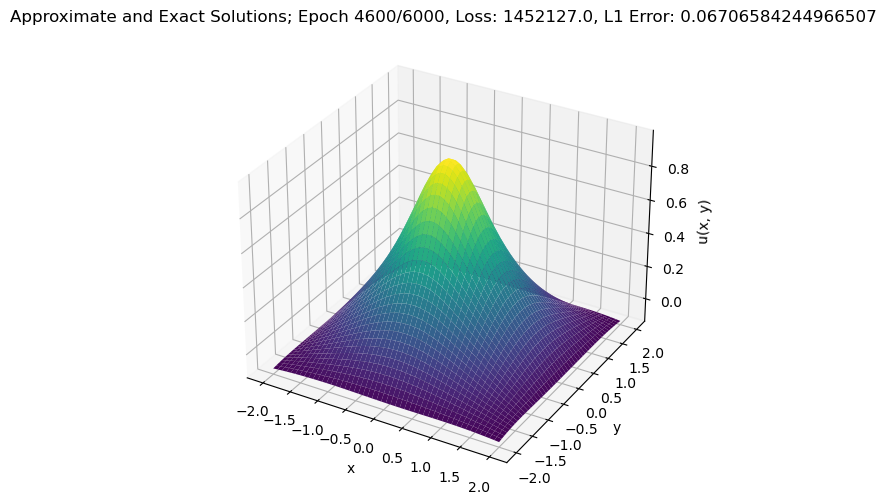

Epoch 4700/6000, Loss: 1494499.0, L1 Error: 0.051500726491212845


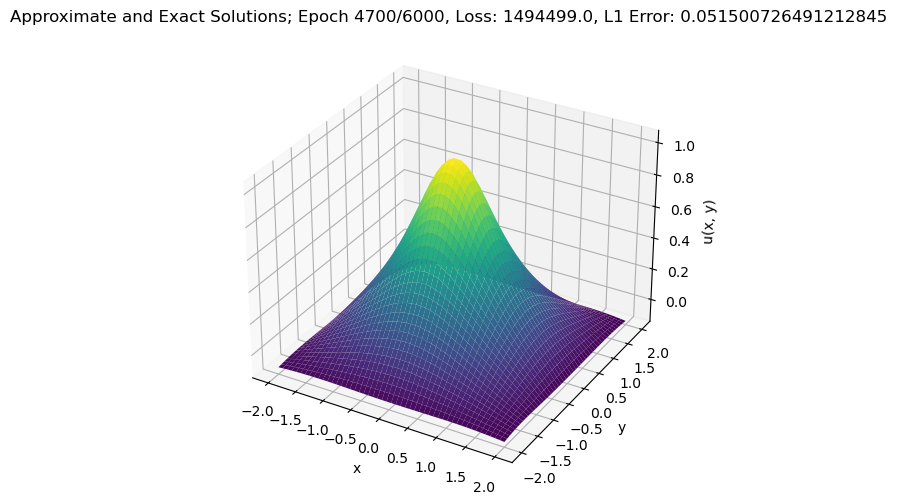

Epoch 4800/6000, Loss: 1425463.875, L1 Error: 0.07161322981119156


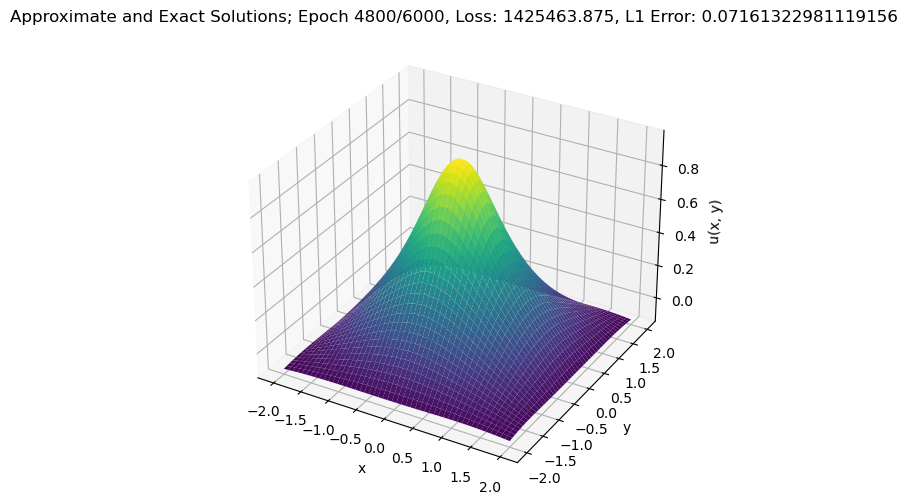

Epoch 4900/6000, Loss: 1455137.625, L1 Error: 0.059166062623262405


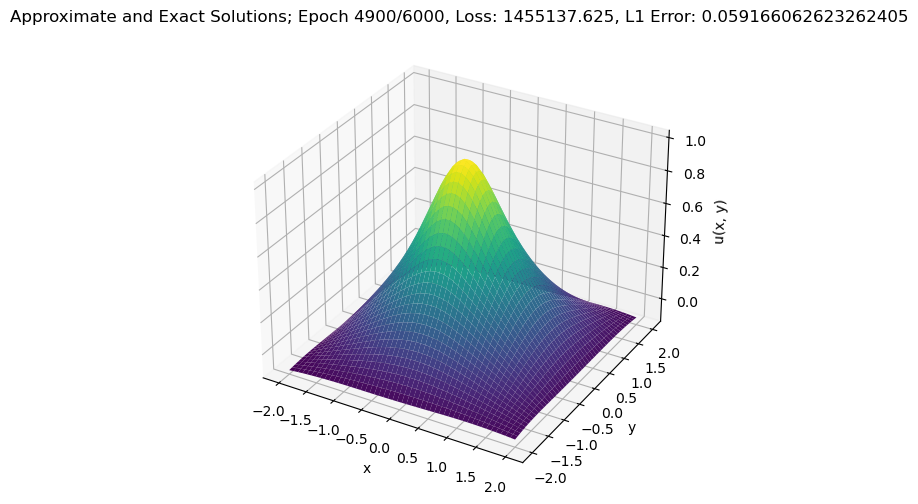

Epoch 5000/6000, Loss: 1424219.125, L1 Error: 0.07996180653572083


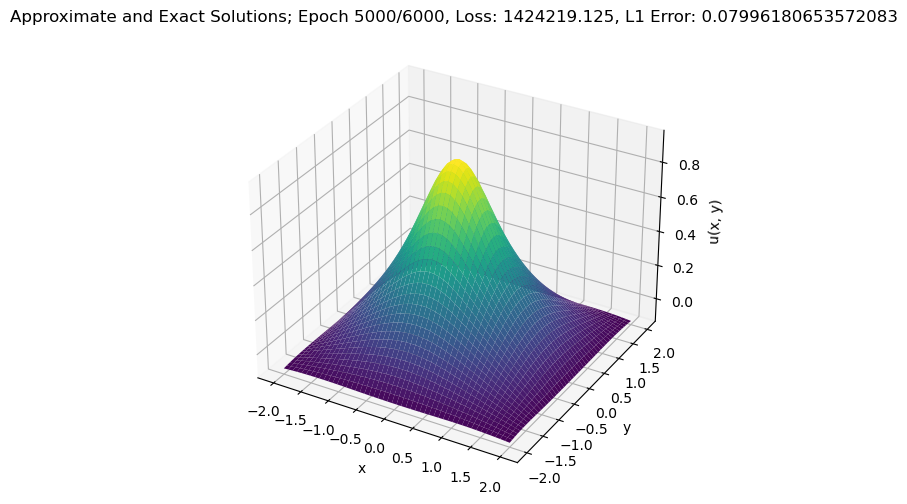

Epoch 5100/6000, Loss: 1473458.625, L1 Error: 0.08559710532426834


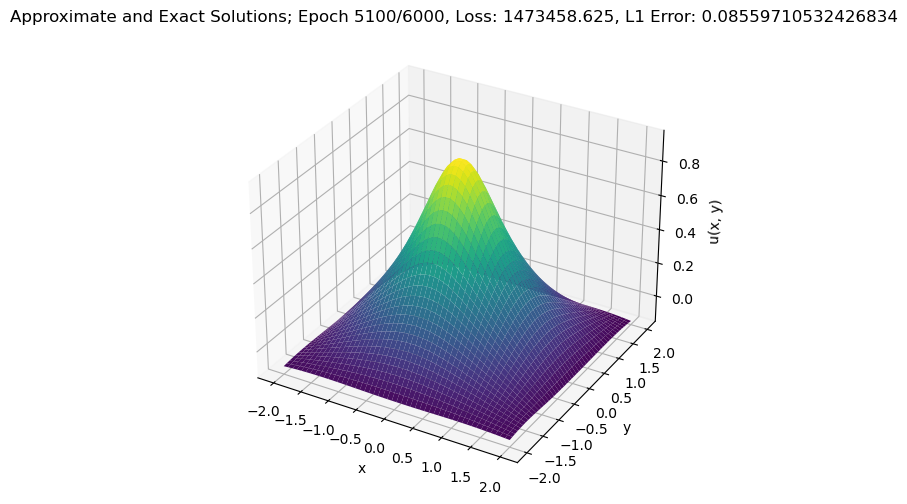

Epoch 5200/6000, Loss: 1457488.75, L1 Error: 0.057202789932489395


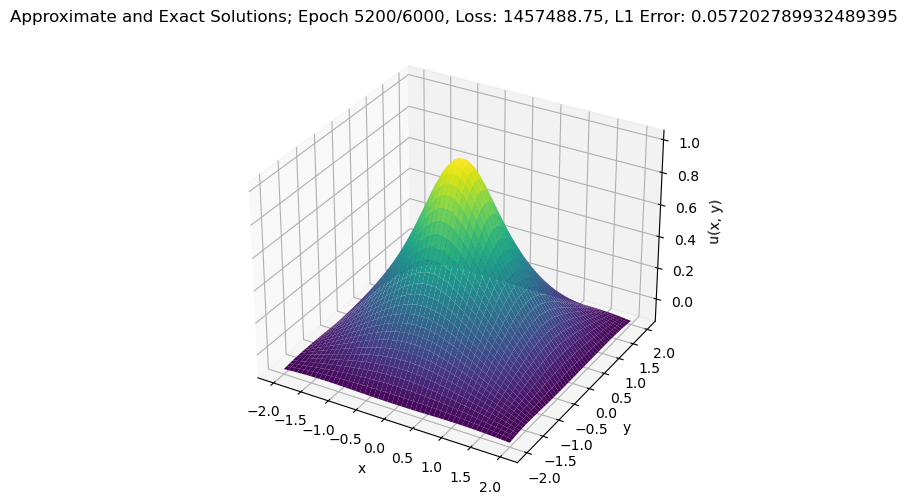

Epoch 5300/6000, Loss: 1487551.5, L1 Error: 0.06387221813201904


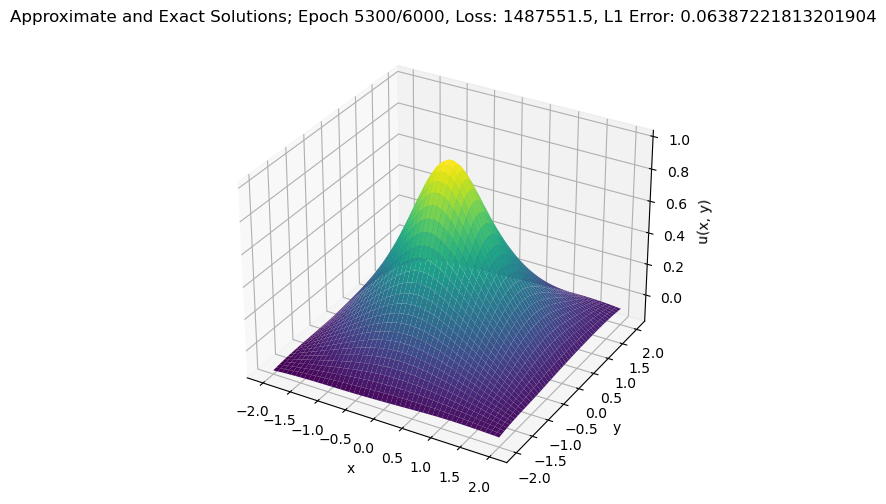

Epoch 5400/6000, Loss: 1442254.5, L1 Error: 0.08621396124362946


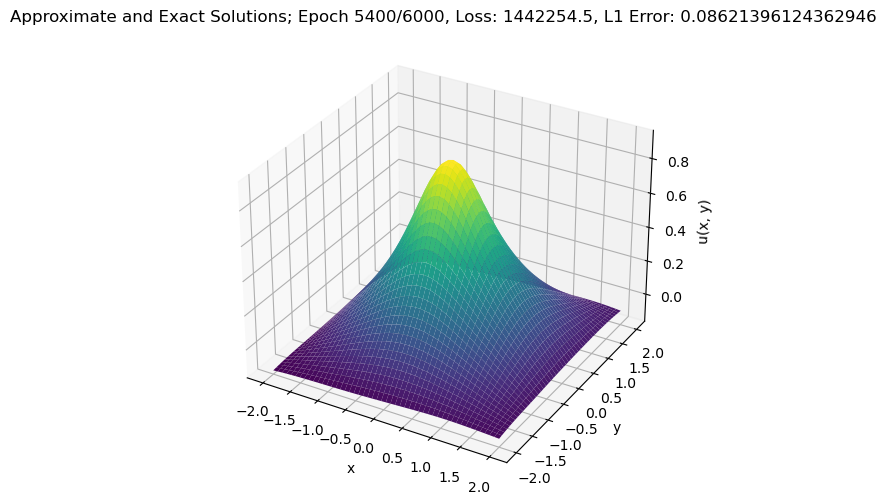

KeyboardInterrupt: 

In [96]:
class PINN(nn.Module):
    def __init__(self,num_layers = 5, hidden_size = 60, output_size = 1, input_size = 2):
        
        super().__init__()
        h = hidden_size
        assert num_layers >=2
        self.fc_u = nn.ModuleList()
        self.ln_u = nn.ModuleList()
        self.fc_u.append(nn.Linear(input_size, h))
        self.ln_u.append(nn.Tanh())
        for _ in range(num_layers - 2):
            self.fc_u.append(nn.Linear(h, h))
            self.ln_u.append(nn.Tanh())
        self.fc_u.append(nn.Linear(h, output_size))

    def forward(self, x):
        u = self.u_net(x)
        return u 

    def u_net(self, x):
        for i in range(len(self.fc_u) - 1):
            layer = self.fc_u[i]
            tanh = self.ln_u[i]
            x = layer(x)
            x = tanh(x)
        x = self.fc_u[-1](x)
        return x

# def cal_u_exact(x):
#     # x = np.linspace(0,1,100)
#     u = torch.zeros_like(x)
#     cond1 = (x>=0) * (x< 1/(2*math.sqrt(2)))
#     cond2 = (x>= 1/(2*math.sqrt(2))) * (x< 0.5)
#     cond3 = (x>=0.5) * (x<1- 1/(2*math.sqrt(2)))
#     cond4 = (x>= ( 1 - 1/(2*math.sqrt(2)))) * (x<=1)
#     x1 = x[cond1]
#     x2 = x[cond2]
#     x3 = x[cond3]
#     x4 = x[cond4]
#     u[cond1] = (100 - 50 * math.sqrt(2)) *x1
#     u[cond2] = 100 * x2 * (1 - x2) - 12.5
#     u[cond3] = 100 * x3 * (1 - x3) - 12.5
#     u[cond4] = (100 - 50 * math.sqrt(2)) * (1 - x4)
#     # if config['visual'] == True:
#     # plt.plot(x,u);plt.show()
#     return u
        
# def g(x, y):
#     r = np.sqrt(x**2 + y**2)
#     r_tmp = np.sqrt(1 - r**2)
#     cond = r <= 1
#     g_val = np.ones_like(r) * (-1)
#     g_val[cond] = r_tmp[cond]
#     return g_val


def differentiable_heaviside(x, epsilon=1e-6):
    return (torch.tanh(x / epsilon) + 1) / 2



def loss_function(u_int, u_bound, x_interior, y_interior, x_boundary, y_boundary, g, f, h):
#     u_prime = torch.autograd.grad(u, x, grad_outputs=torch.ones_like(u), create_graph=True, retain_graph=True)[0]
#     u_doubleprime = torch.autograd.grad(u_prime, x, grad_outputs=torch.ones_like(u_prime), create_graph=True, retain_graph=True)[0]
    
#     loss = (10**(-3)) * torch.sum(torch.square(torch.min((- u_doubleprime + lambda_val), torch.zeros_like(- u_doubleprime - lambda_val))))
#     loss = torch.sum(torch.square(torch.mul(torch.heaviside((u - g), values = torch.tensor([1.0])), u_doubleprime)))
    
    u_x = torch.autograd.grad(u_int, x_interior, grad_outputs=torch.ones_like(u_int), create_graph=True, retain_graph=True)[0]
    u_y = torch.autograd.grad(u_int, y_interior, grad_outputs=torch.ones_like(u_int), create_graph=True, retain_graph=True)[0]
    u_xx = torch.autograd.grad(u_x, x_interior, grad_outputs=torch.ones_like(u_x), create_graph=True, retain_graph=True)[0]
    u_yy = torch.autograd.grad(u_y, y_interior, grad_outputs=torch.ones_like(u_y), create_graph=True, retain_graph=True)[0]
    
    
    heaviside_approx = differentiable_heaviside(u_int - g)  # Use the differentiable Heaviside function
    obstacle_term = torch.relu(g - u_int) #torch.min((u - g), torch.zeros_like(u - g))
    loss = torch.sum(torch.square((torch.mul(heaviside_approx, u_xx + u_yy + f)) + obstacle_term))
    
    
#     loss += torch.sum(torch.square(obstacle_term))    
#     loss += torch.sum(torch.square(lambda_val + (1/gamma) * torch.max(torch.zeros_like(u), g - gamma * lambda_val - u)))  # lambda = -(1/gamma) * max(0, u - gamma * lambda - g)
    loss += (10**(5)) * torch.sum(torch.square(u_bound - h))
#     loss += (10**(3)) * torch.sum(torch.square(u_bound - h))    

    return torch.sum(loss)

def train(model, x, y, x_boundary, y_boundary, g, f, h, epochs=6000, lr=0.001):
    optimizer = optim.Adam(model.parameters(), lr=lr)

    for epoch in range(epochs):
        optimizer.zero_grad()
        x = torch.reshape(x, (-1, ))
        y = torch.reshape(y, (-1, ))
        x_boundary = torch.reshape(x_boundary, (-1, ))
        y_boundary = torch.reshape(y_boundary, (-1, ))
        g = torch.reshape(g, (-1, ))
        f = torch.reshape(f, (-1, ))
        h = torch.reshape(h, (-1, ))
        u_int = model(torch.stack((x, y), dim=1))
#         print("u_int shape   " + str(u_int.shape))
#         print("g shape   " + str(g.shape))
#         print("f shape   " + str(f.shape))
#         print("x_boundary shape   " + str(x_boundary.shape))
#         print("h shape   " + str(h.shape))
        u_bound = model(torch.stack((x_boundary, y_boundary), dim=1))
#         print("u_bound shape   " + str(u_bound.shape))
        energy = loss_function(u_int, u_bound, x, y, x_boundary, y_boundary, g, f, h)
        loss = energy 
        loss.backward(retain_graph=True)
        torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()

#         if epoch % 100 == 0:
            
#             print(f"Epoch {epoch}/{epochs}, Loss: {loss.item()}")
#             x_np = x.detach().numpy()
#             u_np = model.u_net(x).detach().numpy()
#             u_exact_np = cal_u_exact(x).detach().numpy()

#             plt.figure(figsize=(6, 6))
#             plt.plot(x_np, u_np, label='Approximate Solution')
#             plt.plot(x_np, u_exact_np, label='Exact u(x)')
# #             plt.plot(x_np, g.detach().numpy(), label='Obstacle g(x)')
# #             plt.plot(x_np, lambda_np, label='Lambda Function')
#             plt.xlabel('x')
#             plt.ylabel('u(x)')
# #             plt.title('Approximate Solution; '+f"Epoch {epoch}/{epochs}, Loss: {loss.item()}")
#             plt.grid(True)
#             plt.legend()
#             plt.show()
        if epoch % 100 == 0:

            # Convert tensors to NumPy arrays
            x_np = x.detach().numpy()
            y_np = y.detach().numpy()
            u_np = model.u_net(torch.stack((x, y), dim=1))
            u_np = torch.reshape(u_np, (50, 50)).detach().numpy()
            u_exact_np = u_exact(x_np, y_np, r_star)
            l1_error = np.abs(u_np.reshape(2500) - u_exact_np).mean()
            print(f"Epoch {epoch}/{epochs}, Loss: {loss.item()}, L1 Error: {l1_error}")

            # Create 3D meshgrid for plotting
#             X, Y = np.meshgrid(x_np, y_np)

            fig = plt.figure(figsize=(10, 6))
            ax = fig.add_subplot(111, projection='3d')

            # Plot u_np
            ax.plot_surface(x_np.reshape(50, 50), y_np.reshape(50, 50), u_np, cmap='viridis', edgecolor='none')

            # Plot u_exact_np
#             ax.plot_surface(x_np, y_np, u_exact_np, cmap='plasma', edgecolor='none')

            ax.set_xlabel('x')
            ax.set_ylabel('y')
            ax.set_zlabel('u(x, y)')
            
            ax.set_title(f"Approximate and Exact Solutions; Epoch {epoch}/{epochs}, Loss: {loss.item()}, L1 Error: {l1_error}")
            plt.show()




num_interior = 50
r_star = 0.6979651482
x_interior = np.linspace(-2, 2, num_interior)
y_interior = np.linspace(-2, 2, num_interior)

# x_interior = x_interior.reshape(num_interior, 1)
# y_interior = y_interior.reshape(num_interior, 1)

X_interior, Y_interior = np.meshgrid(x_interior, y_interior)

step_size = 0.5

# Generate boundary points on the x-axis
x_points = []
for x in np.arange(-2, 2 + step_size, step_size):
    x_points.append([x, -2])  # Lower boundary point
    x_points.append([x, 2])   # Upper boundary point

# Generate boundary points on the y-axis
y_points = []
for y in np.arange(-2, 2 + step_size, step_size):
    y_points.append([-2, y])  # Left boundary point
    y_points.append([2, y])   # Right boundary point

# Combine the x and y boundary points
boundary_points = np.array(x_points + y_points)

X_boundary, Y_boundary = boundary_points[:, 0], boundary_points[:, 1]


g_interior = np.sqrt(1 - np.sqrt(X_interior ** 2 + Y_interior ** 2) ** 2)
g_interior[np.sqrt(X_interior ** 2 + Y_interior ** 2) > 1] = -1

h_boundary = u_exact(X_boundary, Y_boundary, r_star)

x_interior_tensor = torch.tensor(X_interior, dtype=torch.float32, requires_grad=True)
y_interior_tensor = torch.tensor(Y_interior, dtype=torch.float32, requires_grad=True)
g_interior_tensor = torch.tensor(g_interior, dtype=torch.float32)

x_boundary_tensor = torch.tensor(X_boundary, dtype=torch.float32, requires_grad=True)
y_boundary_tensor = torch.tensor(Y_boundary, dtype=torch.float32, requires_grad=True)
h_boundary_tensor = torch.tensor(h_boundary, dtype=torch.float32)

# x_tensor = torch.cat((x_interior_tensor,x_boundary_tensor))
# y_tensor = torch.cat((y_interior_tensor,y_boundary_tensor))
# g_tensor = torch.tensor(g(x_tensor.detach().numpy(), y_tensor.detach().numpy(), r_star))
f_tensor = torch.full_like(x_interior_tensor, 0)

model = PINN()

train(model, x_interior_tensor, y_interior_tensor, x_boundary_tensor, y_boundary_tensor, g_interior_tensor, f_tensor, h_boundary_tensor)


In [91]:
step_size = 0.5

# Generate boundary points on the x-axis
x_points = []
for x in np.arange(-2, 2 + step_size, step_size):
    x_points.append([x, -2])  # Lower boundary point
    x_points.append([x, 2])   # Upper boundary point

# Generate boundary points on the y-axis
y_points = []
for y in np.arange(-2, 2 + step_size, step_size):
    y_points.append([-2, y])  # Left boundary point
    y_points.append([2, y])   # Right boundary point

# Combine the x and y boundary points
boundary_points = np.array(x_points + y_points)

In [53]:
torch.cat((x_boundary_tensor, y_boundary_tensor), dim=1).shape

torch.Size([10, 2])

In [78]:
torch.square(x_boundary_tensor) + torch.square(y_boundary_tensor)

tensor([[4.0000e+00, 6.7362e+00, 4.9719e+00, 4.2111e+00, 7.9938e+00, 7.9815e+00,
         4.3639e+00, 4.0716e+00, 7.9321e+00, 7.8645e+00],
        [1.2638e+00, 4.0000e+00, 2.2357e+00, 1.4749e+00, 5.2576e+00, 5.2453e+00,
         1.6278e+00, 1.3354e+00, 5.1960e+00, 5.1283e+00],
        [3.0281e+00, 5.7643e+00, 4.0000e+00, 3.2392e+00, 7.0219e+00, 7.0096e+00,
         3.3921e+00, 3.0997e+00, 6.9603e+00, 6.8926e+00],
        [3.7889e+00, 6.5251e+00, 4.7608e+00, 4.0000e+00, 7.7827e+00, 7.7704e+00,
         4.1529e+00, 3.8606e+00, 7.7211e+00, 7.6534e+00],
        [6.2468e-03, 2.7424e+00, 9.7811e-01, 2.1730e-01, 4.0000e+00, 3.9877e+00,
         3.7017e-01, 7.7859e-02, 3.9384e+00, 3.8707e+00],
        [1.8499e-02, 2.7547e+00, 9.9036e-01, 2.2955e-01, 4.0123e+00, 4.0000e+00,
         3.8242e-01, 9.0112e-02, 3.9506e+00, 3.8830e+00],
        [3.6361e+00, 6.3722e+00, 4.6079e+00, 3.8471e+00, 7.6298e+00, 7.6176e+00,
         4.0000e+00, 3.7077e+00, 7.5682e+00, 7.5005e+00],
        [3.9284e+00, 6.6646

C:\Users\Sadman\AppData\Local\Temp\ipykernel_19512\496984284.py:6: RuntimeWarning: divide by zero encountered in log
  r_tmp = ((-1) * (r_star**2) * np.log(r / 2)) / np.sqrt(1 - r_star**2)
C:\Users\Sadman\AppData\Local\Temp\ipykernel_19512\496984284.py:7: RuntimeWarning: invalid value encountered in sqrt
  U_exact[cond1] = np.sqrt(1 - r**2)[cond1]


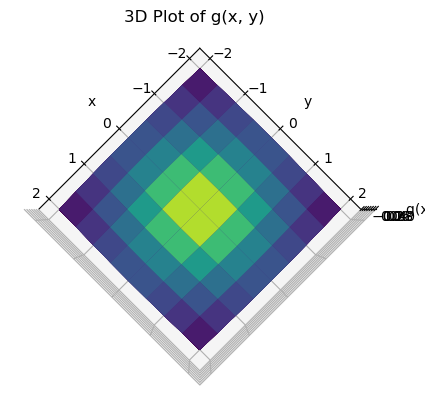

In [12]:
step_size = 0.5
r_star = 0.6979651482

x_points = []
for x in np.arange(-2, 2 + step_size, step_size):
    x_points.append([x, -2])  # Lower boundary point
    x_points.append([x, 2])   # Upper boundary point

# Generate boundary points on the y-axis
y_points = []
for y in np.arange(-2, 2 + step_size, step_size):
    y_points.append([-2, y])  # Left boundary point
    y_points.append([2, y])   # Right boundary point

# Combine the x and y boundary points
boundary_points = np.array(x_points + y_points)

X_boundary, Y_boundary = boundary_points[:, 0], boundary_points[:, 1]

X_boundary, Y_boundary = np.meshgrid(X_boundary, Y_boundary) 
u_exact_ = u_exact(X_boundary, Y_boundary, r_star)
u_exact_ = u_exact_.reshape(X_boundary.shape)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X_boundary, Y_boundary, u_exact_, cmap='viridis', edgecolor='none')
# ax.plot_surface(X_interior, Y_interior, g_interior, cmap='viridis', edgecolor='none')

# Set labels and title
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('g(x, y)')
ax.set_title('3D Plot of g(x, y)')

ax.view_init(elev=90, azim=45)


# Show the plot
plt.show()


In [14]:
X_boundary

array([-2. , -2. , -1.5, -1.5, -1. , -1. , -0.5, -0.5,  0. ,  0. ,  0.5,
        0.5,  1. ,  1. ,  1.5,  1.5,  2. ,  2. , -2. ,  2. , -2. ,  2. ,
       -2. ,  2. , -2. ,  2. , -2. ,  2. , -2. ,  2. , -2. ,  2. , -2. ,
        2. , -2. ,  2. ])

In [15]:
Y_boundary

array([-2. ,  2. , -2. ,  2. , -2. ,  2. , -2. ,  2. , -2. ,  2. , -2. ,
        2. , -2. ,  2. , -2. ,  2. , -2. ,  2. , -2. , -2. , -1.5, -1.5,
       -1. , -1. , -0.5, -0.5,  0. ,  0. ,  0.5,  0.5,  1. ,  1. ,  1.5,
        1.5,  2. ,  2. ])

In [20]:
X_boundary = np.array([-2, 2])
Y_boundary = np.linspace(-2, 2, 50)
xx, yy = np.meshgrid(X_boundary, Y_boundary) 

In [21]:
xx

array([[-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2],
       [-2,  2]])

In [22]:
yy

array([[-2.        , -2.        ],
       [-1.91836735, -1.91836735],
       [-1.83673469, -1.83673469],
       [-1.75510204, -1.75510204],
       [-1.67346939, -1.67346939],
       [-1.59183673, -1.59183673],
       [-1.51020408, -1.51020408],
       [-1.42857143, -1.42857143],
       [-1.34693878, -1.34693878],
       [-1.26530612, -1.26530612],
       [-1.18367347, -1.18367347],
       [-1.10204082, -1.10204082],
       [-1.02040816, -1.02040816],
       [-0.93877551, -0.93877551],
       [-0.85714286, -0.85714286],
       [-0.7755102 , -0.7755102 ],
       [-0.69387755, -0.69387755],
       [-0.6122449 , -0.6122449 ],
       [-0.53061224, -0.53061224],
       [-0.44897959, -0.44897959],
       [-0.36734694, -0.36734694],
       [-0.28571429, -0.28571429],
       [-0.20408163, -0.20408163],
       [-0.12244898, -0.12244898],
       [-0.04081633, -0.04081633],
       [ 0.04081633,  0.04081633],
       [ 0.12244898,  0.12244898],
       [ 0.20408163,  0.20408163],
       [ 0.28571429,

In [14]:
X_interior[:, 0]


array([[-2.        , -1.91836735, -1.83673469, ...,  1.83673469,
         1.91836735,  2.        ],
       [-2.        , -1.91836735, -1.83673469, ...,  1.83673469,
         1.91836735,  2.        ],
       [-2.        , -1.91836735, -1.83673469, ...,  1.83673469,
         1.91836735,  2.        ],
       ...,
       [-2.        , -1.91836735, -1.83673469, ...,  1.83673469,
         1.91836735,  2.        ],
       [-2.        , -1.91836735, -1.83673469, ...,  1.83673469,
         1.91836735,  2.        ],
       [-2.        , -1.91836735, -1.83673469, ...,  1.83673469,
         1.91836735,  2.        ]])

In [16]:
Y_interior[0, :]

array([-2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2.,
       -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2.,
       -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2.,
       -2., -2., -2., -2., -2., -2., -2., -2., -2., -2., -2.])

C:\Users\Sadman\AppData\Local\Temp\ipykernel_19512\496984284.py:7: RuntimeWarning: invalid value encountered in sqrt
  U_exact[cond1] = np.sqrt(1 - r**2)[cond1]


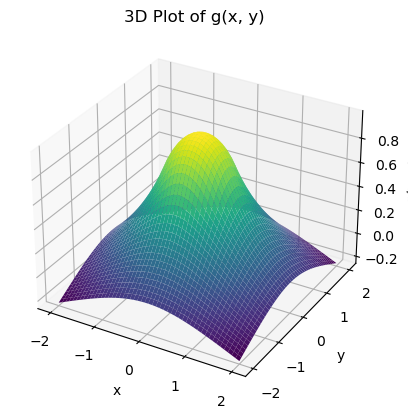

In [17]:
num_interior = 50
step_size = 0.5

x_interior = np.linspace(-2, 2, num_interior)
y_interior = np.linspace(-2, 2, num_interior)

# x_interior = x_interior.reshape(num_interior, 1)
# y_interior = y_interior.reshape(num_interior, 1)

X_interior, Y_interior = np.meshgrid(x_interior, y_interior)

r_star = 0.6979651482

u_exact_ = u_exact(X_interior, Y_interior, r_star)

# Create a 3D plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Plot the surface
ax.plot_surface(X_interior, Y_interior, u_exact_, cmap='viridis', edgecolor='none')
# ax.plot_surface(X_interior, Y_interior, g_interior, cmap='viridis', edgecolor='none')

# Set labels and title
ax.set_xlabel('x')
ax.set_ylabel('y')
ax.set_zlabel('g(x, y)')
ax.set_title('3D Plot of g(x, y)')

# ax.view_init(elev=90, azim=45)

# Show the plot
plt.show()

In [11]:
u_exact_

array([[-0.23575995, -0.22188108, -0.20802704, ..., -0.20802704,
        -0.22188108, -0.23575995],
       [-0.22188108, -0.2074117 , -0.19294261, ..., -0.19294261,
        -0.2074117 , -0.22188108],
       [-0.20802704, -0.19294261, -0.17783055, ..., -0.17783055,
        -0.19294261, -0.20802704],
       ...,
       [-0.20802704, -0.19294261, -0.17783055, ..., -0.17783055,
        -0.19294261, -0.20802704],
       [-0.22188108, -0.2074117 , -0.19294261, ..., -0.19294261,
        -0.2074117 , -0.22188108],
       [-0.23575995, -0.22188108, -0.20802704, ..., -0.20802704,
        -0.22188108, -0.23575995]])